# ***Performing EDA on Accidents across USA from 2016~2022***

# ***About Dataset:***
#### ***Source: Kaggle***
#### ***Dataset_Name: US_car_accidents_2016-2021***
#### ***Source_link:***
https://www.kaggle.com/datasets/sobhanmoosavi/us-accidents
#### ***Size 1.5GB***
#### ***Description:***
This dataset contains the number of car accidents in the US from Feb 2016 to 2021.
This is a countrywide car accident dataset, which covers 49 states of the USA. The accident data are collected from February 2016 to Dec 2021, using multiple APIs that provide streaming traffic incident (or event) data. These APIs broadcast traffic data captured by a variety of entities, such as the US and state departments of transportation, law enforcement agencies, traffic cameras, and traffic sensors within the road-networks. Currently, there are about 2.8 million accident records in this dataset.

### ***Features:***
### We have 47 features in this dataset, but we will discuss only few of them which are more useful.
- useful columns
#### 1. Severity:
- hows the severity of the accident, a number between 1 and 4, where 1 indicates the least impact on traffic (i.e., short delay as a result of the accident) and 4 indicates a significant impact on traffic (i.e., long delay).	No
#### 2. Start_Lat
-	Shows latitude in GPS coordinate of the start point.	No
#### 3. Start_Lng
-	Shows longitude in GPS coordinate of the start point.	No
#### 5. Distance(mi)
-	The length of the road extent affected by the accident.	No
#### 6. City
-	Shows the city in address field.	Yes
#### 7. State
-	Shows the state in address field.	Yes
#### 8. Country
-	Shows the country in address field.	Yes
#### 9. Temperature(F)
-	Shows the temperature (in Fahrenheit).	Yes
#### 10. Humidity(%)
-	Shows the humidity (in percentage).	Yes
#### 11. Visibility(mi)
-	Shows visibility (in miles).	
#### 13. Wind_Direction
-	Shows wind direction.	
#### 14. Weather_Condition
-	Shows the weather condition (rain, snow, thunderstorm, fog, etc.)	Yes

# ***Question regarding EDA:***


#### ***Highest Accident?***
- How many States and Cities are included in the accident Dataset?
- Which Cities and Stateshave the highest number of accidents?
#### ***About timing of the accidents***
- At what time of the day are accidents most frequent in?
- which days of the week and which Month during the year have more accidents?
- what is the trends of accidents year over year (increasing / decreasing?).
- is the distribution of accidents by hour the same on weekends as on weekdays.
#### ***In terms of Severity?***
- Which type of accidents  most occured in terms of severity.
#### ***Show Locations on MAP***
- Show in the map which area has high percentage of accidents as well as severity.
- Show in the map which area has high percentage of accidents using Heatmap.
#### ***Impact of Weather Conditions and Temprature?***
- Does weather conditions i.e sunny, overcast etc have an impact.
- Does Temprature in (F) have an impact?


## ***Libraries***

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import folium


## ***Reading data***

In [2]:
#readin data
df = pd.read_csv('/kaggle/input/us-accidents/US_Accidents_Dec21_updated.csv')
df.head()

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.865420,-84.062800,39.865010,-84.048730,0.747,At OH-4/OH-235/Exit 41 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Night
2,A-3,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.102660,-84.524680,39.102090,-84.523960,0.055,At I-71/US-50/Exit 1 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Day
3,A-4,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.062130,-81.537840,41.062170,-81.535470,0.123,At Dart Ave/Exit 21 - Accident.,...,False,False,False,False,False,False,Night,Night,Day,Day
4,A-5,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day


## ***Rows & Columns***

In [3]:
print(df.shape[0])
print(df.shape[1])


2845342
47


## ***Information about data***

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2845342 entries, 0 to 2845341
Data columns (total 47 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Severity               int64  
 2   Start_Time             object 
 3   End_Time               object 
 4   Start_Lat              float64
 5   Start_Lng              float64
 6   End_Lat                float64
 7   End_Lng                float64
 8   Distance(mi)           float64
 9   Description            object 
 10  Number                 float64
 11  Street                 object 
 12  Side                   object 
 13  City                   object 
 14  County                 object 
 15  State                  object 
 16  Zipcode                object 
 17  Country                object 
 18  Timezone               object 
 19  Airport_Code           object 
 20  Weather_Timestamp      object 
 21  Temperature(F)         float64
 22  Wind_Chill(F)     

## ***Statisical Information***

In [5]:
df.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Number,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,1.101431e+06,2.776068e+06,2.375699e+06,2.772250e+06,2.786142e+06,2.774796e+06,2.687398e+06,2.295884e+06
mean,2.137572e+00,3.624520e+01,-9.711463e+01,3.624532e+01,-9.711439e+01,7.026779e-01,8.089408e+03,6.179356e+01,5.965823e+01,6.436545e+01,2.947234e+01,9.099391e+00,7.395044e+00,7.016940e-03
std,4.787216e-01,5.363797e+00,1.831782e+01,5.363873e+00,1.831763e+01,1.560361e+00,1.836009e+04,1.862263e+01,2.116097e+01,2.287457e+01,1.045286e+00,2.717546e+00,5.527454e+00,9.348831e-02
min,1.000000e+00,2.456603e+01,-1.245481e+02,2.456601e+01,-1.245457e+02,0.000000e+00,0.000000e+00,-8.900000e+01,-8.900000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.000000e+00,3.344517e+01,-1.180331e+02,3.344628e+01,-1.180333e+02,5.200000e-02,1.270000e+03,5.000000e+01,4.600000e+01,4.800000e+01,2.931000e+01,1.000000e+01,3.500000e+00,0.000000e+00
50%,2.000000e+00,3.609861e+01,-9.241808e+01,3.609799e+01,-9.241772e+01,2.440000e-01,4.007000e+03,6.400000e+01,6.300000e+01,6.700000e+01,2.982000e+01,1.000000e+01,7.000000e+00,0.000000e+00
75%,2.000000e+00,4.016024e+01,-8.037243e+01,4.016105e+01,-8.037338e+01,7.640000e-01,9.567000e+03,7.600000e+01,7.600000e+01,8.300000e+01,3.001000e+01,1.000000e+01,1.000000e+01,0.000000e+00
max,4.000000e+00,4.900058e+01,-6.711317e+01,4.907500e+01,-6.710924e+01,1.551860e+02,9.999997e+06,1.960000e+02,1.960000e+02,1.000000e+02,5.890000e+01,1.400000e+02,1.087000e+03,2.400000e+01


### ***Length of Numerical data***

In [6]:
#numeric data in dataframe
numeric_df = df.select_dtypes(include=['int64', 'float64'])
print(numeric_df.head())
len(numeric_df.columns)

   Severity  Start_Lat  Start_Lng    End_Lat    End_Lng  Distance(mi)  Number  \
0         3  40.108910 -83.092860  40.112060 -83.031870         3.230     NaN   
1         2  39.865420 -84.062800  39.865010 -84.048730         0.747     NaN   
2         2  39.102660 -84.524680  39.102090 -84.523960         0.055     NaN   
3         2  41.062130 -81.537840  41.062170 -81.535470         0.123     NaN   
4         3  39.172393 -84.492792  39.170476 -84.501798         0.500     NaN   

   Temperature(F)  Wind_Chill(F)  Humidity(%)  Pressure(in)  Visibility(mi)  \
0            42.1           36.1         58.0         29.76            10.0   
1            36.9            NaN         91.0         29.68            10.0   
2            36.0            NaN         97.0         29.70            10.0   
3            39.0            NaN         55.0         29.65            10.0   
4            37.0           29.8         93.0         29.69            10.0   

   Wind_Speed(mph)  Precipitation(in) 

14

### ***Length of Categorical data***

In [7]:
# categorical data in dataframe
categorical_df = df.select_dtypes(include=['object'])
print(categorical_df.head())
len(categorical_df.columns)

    ID           Start_Time             End_Time  \
0  A-1  2016-02-08 00:37:08  2016-02-08 06:37:08   
1  A-2  2016-02-08 05:56:20  2016-02-08 11:56:20   
2  A-3  2016-02-08 06:15:39  2016-02-08 12:15:39   
3  A-4  2016-02-08 06:51:45  2016-02-08 12:51:45   
4  A-5  2016-02-08 07:53:43  2016-02-08 13:53:43   

                                         Description       Street Side  \
0  Between Sawmill Rd/Exit 20 and OH-315/Olentang...  Outerbelt E    R   
1                 At OH-4/OH-235/Exit 41 - Accident.       I-70 E    R   
2                   At I-71/US-50/Exit 1 - Accident.       I-75 S    R   
3                    At Dart Ave/Exit 21 - Accident.       I-77 N    R   
4                 At Mitchell Ave/Exit 6 - Accident.       I-75 S    R   

         City      County State Zipcode Country    Timezone Airport_Code  \
0      Dublin    Franklin    OH   43017      US  US/Eastern         KOSU   
1      Dayton  Montgomery    OH   45424      US  US/Eastern         KFFO   
2  Cincinnati 

20

## ***Finding missing values***

In [8]:
df.isna().sum()

ID                             0
Severity                       0
Start_Time                     0
End_Time                       0
Start_Lat                      0
Start_Lng                      0
End_Lat                        0
End_Lng                        0
Distance(mi)                   0
Description                    0
Number                   1743911
Street                         2
Side                           0
City                         137
County                         0
State                          0
Zipcode                     1319
Country                        0
Timezone                    3659
Airport_Code                9549
Weather_Timestamp          50736
Temperature(F)             69274
Wind_Chill(F)             469643
Humidity(%)                73092
Pressure(in)               59200
Visibility(mi)             70546
Wind_Direction             73775
Wind_Speed(mph)           157944
Precipitation(in)         549458
Weather_Condition          70636
Amenity   

## ***Percentage of missing data in each column***

In [9]:
#percentage of missing data in each column
missing_data_per = df.isna().sum().sort_values(ascending=False) / len(df) * 100

In [10]:
missing_data_per

Number                   61.290031
Precipitation(in)        19.310789
Wind_Chill(F)            16.505678
Wind_Speed(mph)           5.550967
Wind_Direction            2.592834
Humidity(%)               2.568830
Weather_Condition         2.482514
Visibility(mi)            2.479350
Temperature(F)            2.434646
Pressure(in)              2.080593
Weather_Timestamp         1.783125
Airport_Code              0.335601
Timezone                  0.128596
Nautical_Twilight         0.100761
Civil_Twilight            0.100761
Sunrise_Sunset            0.100761
Astronomical_Twilight     0.100761
Zipcode                   0.046356
City                      0.004815
Street                    0.000070
Country                   0.000000
Junction                  0.000000
Start_Time                0.000000
End_Time                  0.000000
Start_Lat                 0.000000
Turning_Loop              0.000000
Traffic_Signal            0.000000
Traffic_Calming           0.000000
Stop                

### ***Missing data in Plot***

<AxesSubplot:>

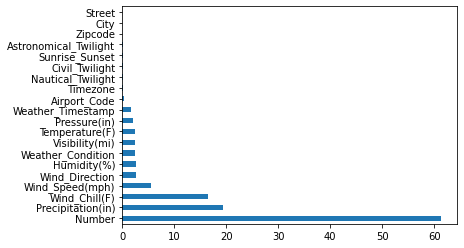

In [11]:
missing_data_per[missing_data_per!=0].plot(kind='barh')

### ***Column Names***

In [12]:
df.columns

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'End_Lat', 'End_Lng', 'Distance(mi)', 'Description', 'Number', 'Street',
       'Side', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

### ***Unique Cities***

In [13]:
len(df.City.unique())


11682

### ***Unique States***

In [14]:
# unique states in dataframe
states = df.State.unique()
len(states)

49

### ***Grouping data by city and state***

In [15]:
# grouping data by state and city
cities_with_state = df.groupby(['State','City']).size().reset_index(name='count')
cities_with_state

,State,City,count
0,AL,Abbeville,6
1,AL,Adamsville,6
2,AL,Addison,2
3,AL,Alabaster,188
4,AL,Albertville,10
...,...,...,...
16925,WY,Torrington,2
16926,WY,Wamsutter,69
16927,WY,Wheatland,26
16928,WY,Wilson,4


### ***Grouping data by cities***

In [16]:
cities_by_state = df.groupby(['City']).size().reset_index(name='count')
cities_by_state

,City,count
0,Aaronsburg,9
1,Abbeville,139
2,Abbotsford,9
3,Abbottstown,25
4,Aberdeen,574
...,...,...
11676,Zortman,13
11677,Zumbro Falls,40
11678,Zumbrota,282
11679,Zuni,18


### ***Grouping data by state***

In [17]:
only_state = df.groupby(['State']).size().reset_index(name='count')
only_state

,State,count
0,AL,19322
1,AR,10935
2,AZ,56504
3,CA,795868
4,CO,25340
5,CT,29762
6,DC,9133
7,DE,4842
8,FL,401388
9,GA,40086


## ***Which Cities have Highest number of accidents?***

In [18]:
cities_by_accidents = df.City.value_counts()
cities_by_accidents

Miami                           106966
Los Angeles                      68956
Orlando                          54691
Dallas                           41979
Houston                          39448
                                 ...  
Ridgedale                            1
Sekiu                                1
Wooldridge                           1
Bullock                              1
American Fork-Pleasant Grove         1
Name: City, Length: 11681, dtype: int64

## ***Which States have Highest number of accidents?***

In [19]:
states_by_accidents = df.State.value_counts()
states_by_accidents

CA    795868
FL    401388
TX    149037
OR    126341
VA    113535
NY    108049
PA     99975
MN     97185
NC     91362
SC     89216
MD     65085
AZ     56504
NJ     52902
TN     52613
UT     49193
LA     47232
IL     47105
MI     43843
GA     40086
WA     32554
CT     29762
MO     29633
CO     25340
OH     24409
IN     20850
AL     19322
MT     15964
AR     10935
IA      9607
DC      9133
KS      9033
OK      8806
ID      8544
WI      7896
WV      7632
KY      6638
MA      6392
NV      6197
MS      5320
DE      4842
RI      4451
NH      3866
NE      3320
NM      2370
ND      2258
ME      2193
WY       990
VT       365
SD       201
Name: State, dtype: int64

## ***Top 5 Cities that have Highest number of accidents?***

In [20]:
cities_by_accidents[:5]

Miami          106966
Los Angeles     68956
Orlando         54691
Dallas          41979
Houston         39448
Name: City, dtype: int64

## ***Top 5 States that have Highest number of accidents?***

In [21]:
states_by_accidents[:5]

CA    795868
FL    401388
TX    149037
OR    126341
VA    113535
Name: State, dtype: int64

## ***Top 5 States that have lowest number of accidents?***

In [22]:
# top 5 states with least accidents
states_by_accidents[::-1][:5]

SD     201
VT     365
WY     990
ME    2193
ND    2258
Name: State, dtype: int64

## ***Top 5 cities that have lowest number of accidents?***

In [23]:
# top 5 cities with least accidents
cities_by_accidents[::-1][:5]

American Fork-Pleasant Grove    1
Bullock                         1
Wooldridge                      1
Sekiu                           1
Ridgedale                       1
Name: City, dtype: int64

## ***Plotting Which States have Highest number of accidents?***

<AxesSubplot:>

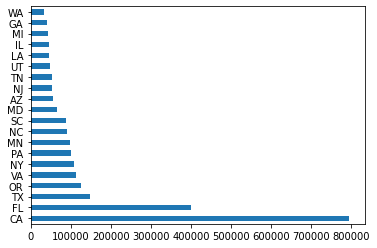

In [24]:
states_by_accidents[:20].plot(kind='barh')

## ***Plotting Which Cities have Highest number of accidents?***

<AxesSubplot:>

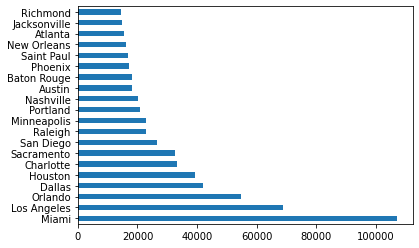

In [25]:
cities_by_accidents[:20].plot(kind='barh')

In [26]:
sns.set_style('whitegrid')

## ***Plotting the trend of number of accident ( exponenetial increase or decrease)***

<AxesSubplot:xlabel='City', ylabel='Density'>

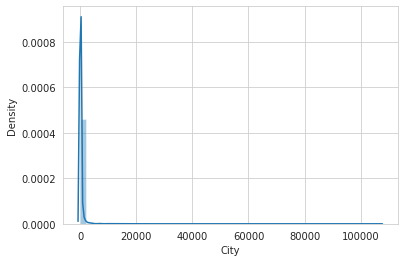

In [27]:
sns.distplot(cities_by_accidents)

## ***Threshold for High and low number of accidents***

In [28]:
high_accidents_cities = cities_by_accidents[cities_by_accidents>=1000]
low_accidents_cities = cities_by_accidents[cities_by_accidents<1000]

## ***Percantage of Cities which have Highest number of accidents?***

In [29]:
len(high_accidents_cities)/len(df.City)*100

0.01743199938706841

## ***Plotting those Cities which have Highest number of accidents?***

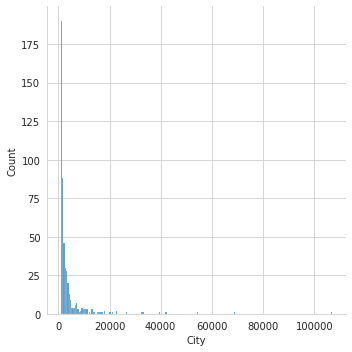

In [30]:
sns.displot(high_accidents_cities)

## ***Plotting those Cities which have lowest number of accidents?***

<AxesSubplot:xlabel='City', ylabel='Density'>

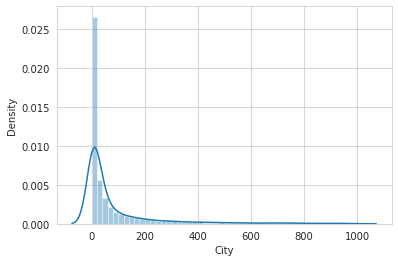

In [31]:
sns.distplot(low_accidents_cities)

## ***Plotting the overall ratio of accidents?***

<AxesSubplot:xlabel='City', ylabel='Count'>

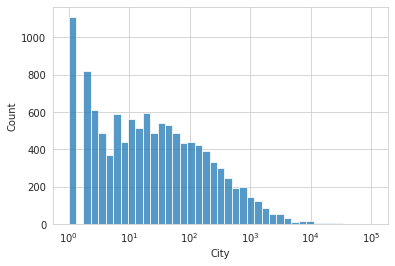

In [32]:
sns.histplot(cities_by_accidents, log_scale=True)

In [33]:
df.Start_Time[0]

'2016-02-08 00:37:08'

In [34]:
df.Start_Time = pd.to_datetime(df.Start_Time)

In [35]:
df.Start_Time[0]

Timestamp('2016-02-08 00:37:08')

## ***The Hours during which have Highest number of accidents in a day?***

<AxesSubplot:xlabel='Start_Time', ylabel='Count'>

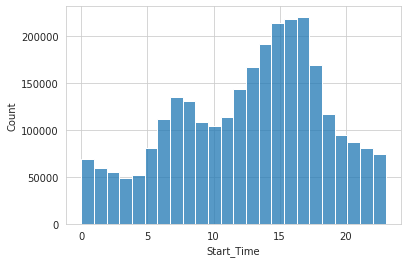

In [36]:
sns.histplot(df.Start_Time.dt.hour,bins=24)

<AxesSubplot:xlabel='Start_Time', ylabel='Density'>

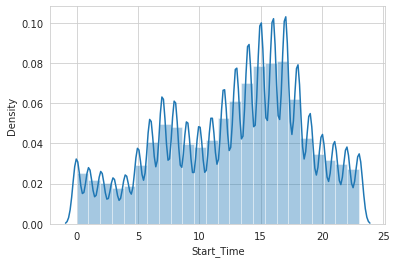

In [37]:
sns.distplot(df.Start_Time.dt.hour,bins=24)

## ***The days during which have Highest number of accidents in a week?***

<AxesSubplot:xlabel='Start_Time'>

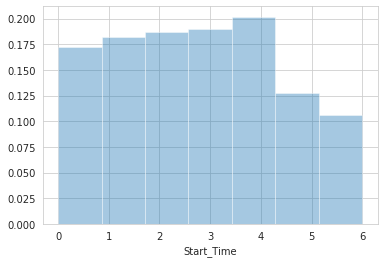

In [38]:
sns.distplot(df.Start_Time.dt.dayofweek,bins=7, kde=False,norm_hist=True)

## ***How many Accidents occured on Sunday?***

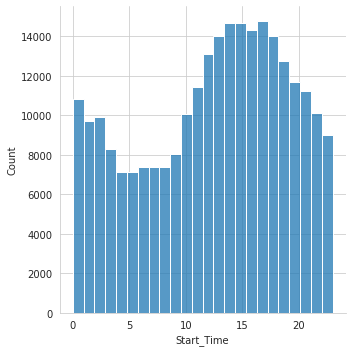

In [39]:
sunday_start_time = df.Start_Time[df.Start_Time.dt.dayofweek == 6]
sns.displot(sunday_start_time.dt.hour, bins=24, kde=False)

## ***How many Accidents occured on Monday?***

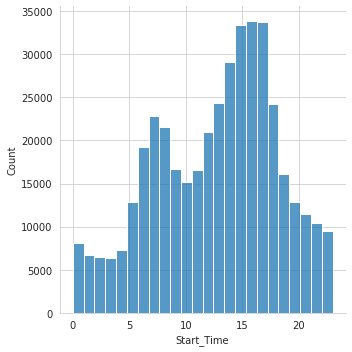

In [40]:
monday_start_time = df.Start_Time[df.Start_Time.dt.dayofweek == 0]
sns.displot(monday_start_time.dt.hour, bins=24, kde=False)

### ***Trend of accident in 2021***

Total accidents in 2021 1511745


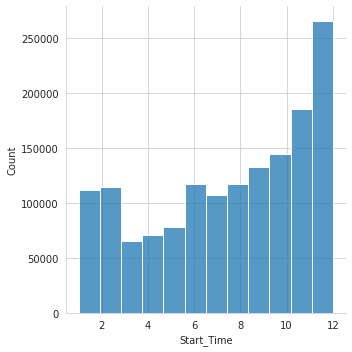

In [41]:
df_2021 = df[df.Start_Time.dt.year == 2021]
sns.displot(df_2021.Start_Time.dt.month,bins=12, kde=False)
print("Total accidents in 2021",df_2021.Start_Time.dt.month.value_counts().sum())

### ***Trend of accident in 2020***

Total accidents in 2020 625864


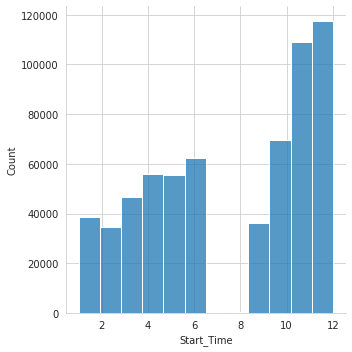

In [42]:
df_2020 = df[df.Start_Time.dt.year == 2020]
sns.displot(df_2020.Start_Time.dt.month,bins=12, kde=False)
print("Total accidents in 2020",df_2020.Start_Time.dt.month.value_counts().sum())

### ***Trend of accident in 2019***

Total accidents in 2019 258615


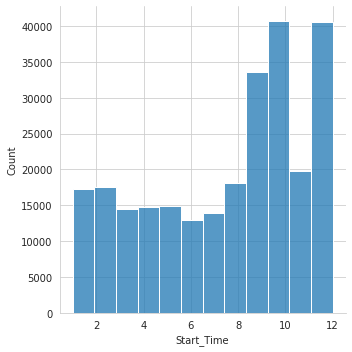

In [43]:
df_2019 = df[df.Start_Time.dt.year == 2019]
sns.displot(df_2019.Start_Time.dt.month,bins=12, kde=False)
print("Total accidents in 2019",df_2019.Start_Time.dt.month.value_counts().sum())

### ***Trend of accident in 2018***

Total accidents in 2018 163176


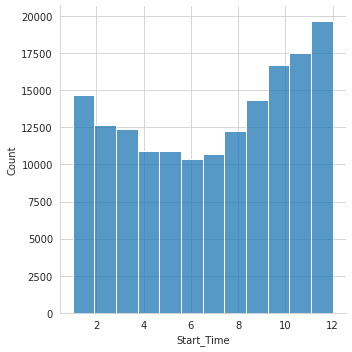

In [44]:
df_2018 = df[df.Start_Time.dt.year == 2018]
sns.displot(df_2018.Start_Time.dt.month,bins=12, kde=False)
print("Total accidents in 2018",df_2018.Start_Time.dt.month.value_counts().sum())

### ***Trend of accident in 2017***

Total accidents in 2017 163918


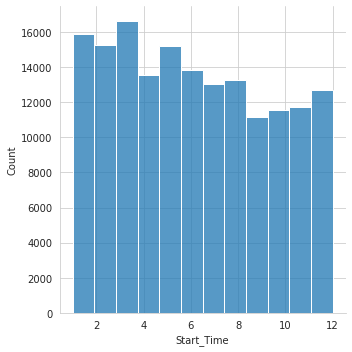

In [45]:
df_2017 = df[df.Start_Time.dt.year == 2017]
sns.displot(df_2017.Start_Time.dt.month,bins=12, kde=False)
print("Total accidents in 2017",df_2017.Start_Time.dt.month.value_counts().sum())

### ***Trend of accident in 2016***

Total accidents in 2016 122024


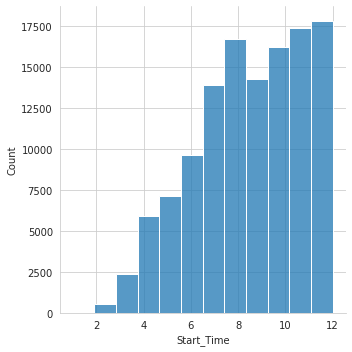

In [46]:
df_2016 = df[df.Start_Time.dt.year == 2016]
sns.displot(df_2016.Start_Time.dt.month,bins=12, kde=False)
print("Total accidents in 2016",df_2016.Start_Time.dt.month.value_counts().sum())

## ***Percentchange in Each Year***

In [47]:
#Total accidents in 2021 1511745
accident_2021 = 1511745
#Total accidents in 2020 625864
accident_2020 = 625864
#Total accidents in 2019 258615
accident_2019 = 258615
#Total accidents in 2018 163176
accident_2018 = 163176
#Total accidents in 2017 163918
accident_2017 = 163918
#Total accidents in 2016 122024
accident_2016 = 122024

percentchange_16_17 = (accident_2017 - accident_2016)/accident_2016 * 100
percentchange_17_18 = (accident_2018 - accident_2017)/accident_2017 * 100
percentchange_18_19 = (accident_2019 - accident_2018)/accident_2018 * 100
percentchange_19_20 = (accident_2020 - accident_2019)/accident_2019 * 100
percentchange_20_21 = (accident_2021 - accident_2020)/accident_2020 * 100
print("Percentage change in 2016 to 2017",percentchange_16_17)
print("Percentage change in 2017 to 2018",percentchange_17_18)
print("Percentage change in 2018 to 2019",percentchange_18_19)
print("Percentage change in 2019 to 2020",percentchange_19_20)
print("Percentage change in 2020 to 2021",percentchange_20_21)


Percentage change in 2016 to 2017 34.33259031010293
Percentage change in 2017 to 2018 -0.4526653570687783
Percentage change in 2018 to 2019 58.48838064421238
Percentage change in 2019 to 2020 142.00607080022428
Percentage change in 2020 to 2021 141.54528779415335


### ***Average of Percentchange Increase***

In [48]:
#percentchange average
percentchange_average = (percentchange_16_17 + percentchange_17_18 + percentchange_18_19 + percentchange_19_20 + percentchange_20_21)/5
print("Percentage change average",percentchange_average)


Percentage change average 75.18393283832484


### ***Which Type of Severity accident occured most***

<AxesSubplot:>

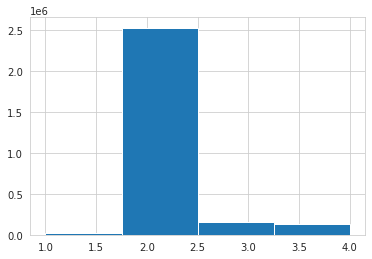

In [49]:
df.Severity.hist(bins=4)

## ***checking the number of accident on basis of temparture from 2016~2021***

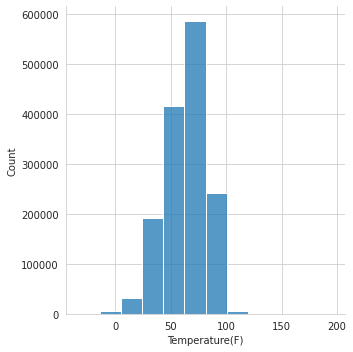

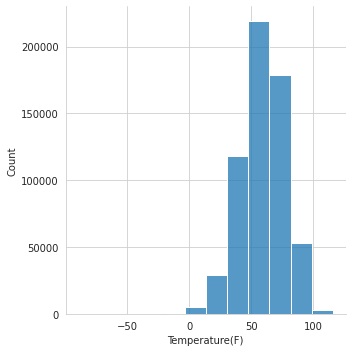

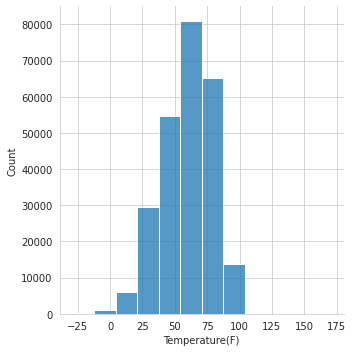

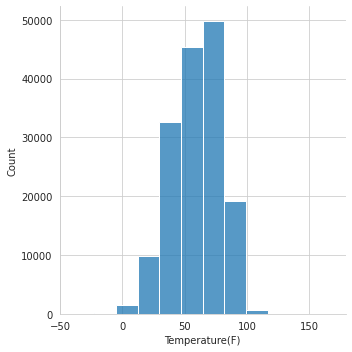

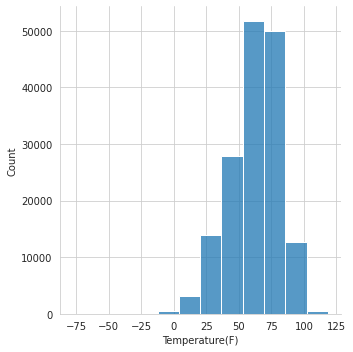

In [50]:
#checking the number of accident on basis of temparture in 2019
print(sns.displot(df_2021['Temperature(F)'],bins=12, kde=False))
print(sns.displot(df_2020['Temperature(F)'],bins=12, kde=False))
print(sns.displot(df_2019['Temperature(F)'],bins=12, kde=False))
print(sns.displot(df_2018['Temperature(F)'],bins=12, kde=False))
print(sns.displot(df_2017['Temperature(F)'],bins=12, kde=False))


### ***Visisbility Impact on Number of Accidents***

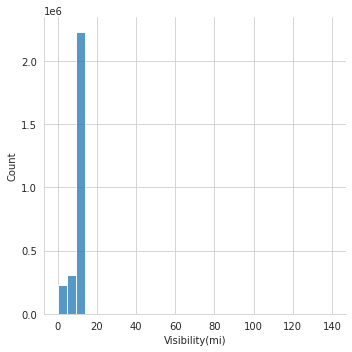

In [51]:
# number of accidents by visibility
print(sns.displot(df['Visibility(mi)'],bins=30))

#### ***Impact of Weather Condition?***

<AxesSubplot:>

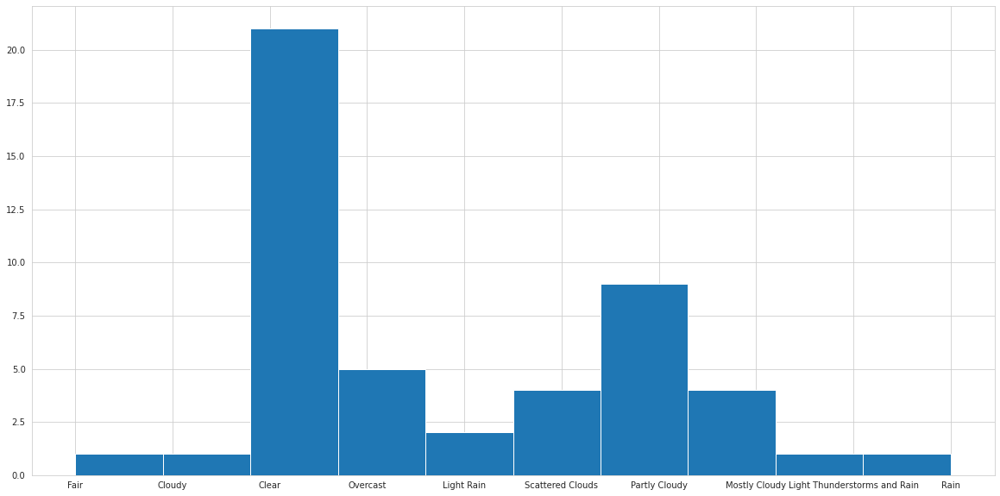

In [52]:

df.Weather_Condition[states_by_accidents].hist(figsize=(20,10))

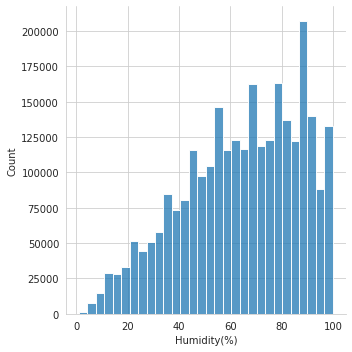

In [53]:
#number of accidents by humidity
print(sns.displot(df['Humidity(%)'],bins=30))

# ***IQR***

## Checking Oultiers

(-5347.25, 112314.25)

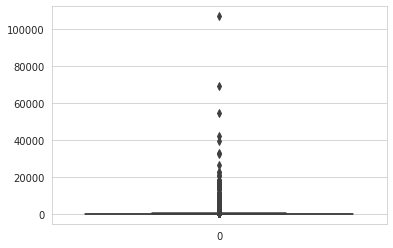

In [54]:
sns.boxplot(data=cities_by_accidents)
plt.ylim()

(-39582.350000000006, 835651.35)

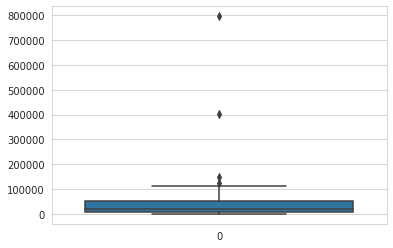

In [55]:
sns.boxplot(data=states_by_accidents)
plt.ylim()

## ***Removing Outliers***

In [56]:
max_threshold = states_by_accidents.quantile(0.95)
min_threshold = states_by_accidents.quantile(0.01)
X_input_removed_outliers = states_by_accidents[(states_by_accidents<max_threshold)&(states_by_accidents>min_threshold)]

(-5933.8, 132639.8)

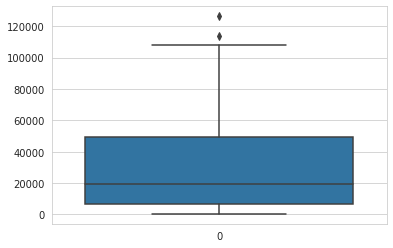

In [57]:
sns.boxplot(data=X_input_removed_outliers)
plt.ylim()

# Map of US whhich shows the severity of the accidents.

<AxesSubplot:xlabel='Start_Lng', ylabel='Start_Lat'>

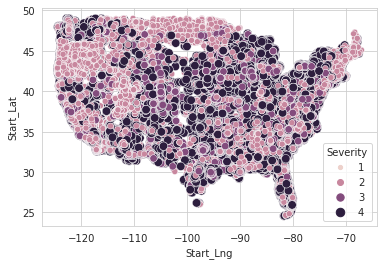

In [58]:
sns.scatterplot(x=df.Start_Lng,y=df.Start_Lat,data=df,size=df.Severity, hue=df.Severity)

# map of US which shows the density of the accidents.

<AxesSubplot:xlabel='Start_Lng', ylabel='Start_Lat'>

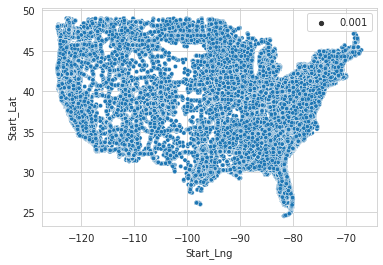

In [59]:
sns.scatterplot(x=df.Start_Lng,y=df.Start_Lat,data=df,size=0.001)

# Heat map of US which shows the density of the accidents.

In [60]:
sample_df = df.sample(frac=0.25)

In [61]:
lat_lon_pairs = list(zip(list(sample_df.Start_Lat), list(sample_df.Start_Lng)))

In [62]:
from folium.plugins import HeatMap


In [63]:
map=folium.Map()
HeatMap(lat_lon_pairs).add_to(map)
map

# ***Summary & Conclusion***

### The number of accidents in the US is increasing every year with percentchange of 75% on average.
### The top 5 states with the highest number of accidents are:
- California
- Florida
- Texas
- Oregan
- Virginica
### the top 5 states with the lowest number of accidents are:
- Washington
- Oregon
- California
- Texas
- New York
### top 5 cities with the highest number of accidents are:
- Miami
- Los Angeles
- Orlando
- Denise
- Houstan
- the top 5 cities with lowest number of accidents are:
- American Fork-Pleasant Grove
- Bullock
- Wooldridge
- Sekiu


## Some other useful insights:
#### On Working Days(Mon-Fri) the number of accidents is higher than on weekends.
#### Only 0.017% of the states have high ratio of accident (i.e greater > 1000)
#### Most of the accidentd reported on morining and eveing timing, but compartively number od accident in evening timeing is much greater.
#### Onweekends the number of accidents in morning drastically decreases.
#### Most accidents are observed when the temprature is in between 50 and 80 farenheit.
#### The trend of increase or decrease in accident is exponentail.
#### The Heatmap ( on the map USA) show that in Coastal areas, the number of accidents is increasing while accidents are comapritively lower in non constal region.
#### We observerd that the most of the accident occured with clear visibilty i.e 10_15 miles but half million of the accidents are occured with less visibility.
#### The the accident of type 2 severity is higher than the other type of accident.
#### Surprisingly the number of accidents were much with high humidity.
# Downlfalls in Dataset:
#### Over 1200 cities reported only one accidents.
#### The NewYork is the city with Highest poppulation should be included in the datset
#### The data is collected from FEB of 2016, so data of January is missing which reduicng the number of accidents in the winter season
#### Some data is missing in between the months.

## if you do liked the insights please upovte  